![Universidad Central](https://www.ucentral.edu.co/sites/default/files/inline-images/identificadores-Centrados_en_ti_logo-h.png)

# *Proyecto de grado*
 **Cuaderno de modelos**

#Integrantes
**Yury Aldana Diaz**

**Sergio Torres**

**John Sierra**

#LIBRERIAS

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
### Kmedias
from sklearn.cluster import KMeans
##Metricas
from sklearn.metrics import silhouette_score
### Análisis descriptivo
from scipy import cluster
from scipy.stats import f_oneway
from scipy.stats import chi2_contingency
from scipy.stats import kruskal
!pip install prince
### ACM
import prince
#Exportar modelo
import pickle
##Regresión Líneal 
from scipy import stats # libreria estadistica de Scipy
from sklearn.feature_selection import RFE # RFE es para seleccionar modelos
from sklearn.model_selection import train_test_split # para dividir la base en modelo y test 
from sklearn import linear_model # para modelo lineal
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error # para sacar las metricas 
import statsmodels.api as sm  ## Parte estadistica
from statsmodels.sandbox.regression.predstd import wls_prediction_std  ## Parte estadistica
from sklearn.metrics import explained_variance_score

##Random Forest
from sklearn.ensemble import RandomForestClassifier ### El importante
from sklearn.ensemble import RandomForestRegressor### El importante
from sklearn import tree
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, classification_report
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_selection import RFE
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples

#LIBRERIAS
from scipy import stats
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn import linear_model, tree
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.svm  import SVR

In [ ]:
# Login google drive
from google.colab import drive
drive.mount('/content/drive')

# Creación Dataframe

In [ ]:
#Ruta de jupiter anaconda
#costo='C:/Users/alexy/Downloads/Req5750_CostoMedico.txt'
costo='C:/Users/usuario/OneDrive/Documents/Datos/final.txt'

In [ ]:
# Rutas google drive y creacion de dataframe
df_costo=pd.read_csv (costo, sep='|', decimal=",", encoding='latin-1')

C:\Users\usuario\AppData\Local\Temp\ipykernel_14640\3399174100.py:12: DtypeWarning: Columns (17,24) have mixed types. Specify dtype option on import or set low_memory=False.
  df_costo=pd.read_csv (costo, sep='|', decimal=",", encoding='latin-1')


In [ ]:
df_costo=df_costo.sample(n=100000, random_state=1)
df_costo.shape

(100000, 31)

# Descripción de datos

In [ ]:
#Función para describir un dataframe
def calculateNull(df):
  '''Descripción: Calcula la cantidad de nulos por columna en un Dataframe

    Parámetros de entrada:
    df (Dataframe): El dataframe que se va revisar

    Retorno:
    lista (list): Lista de la cantidad de nulos por columna

    Valores de error:
    Al ingresar un valor diferente Dataframe
  '''
  lista=[]
  for col in df:
    lista.append(len(df[df[col].isnull()]))
  return lista
def datos(df):
  datos = {
    'Nombre de columna' : df.columns.values.tolist(),
    'Tipo de dato': df.dtypes.values.tolist(),
    'Cantidad valores únicos': df.nunique().tolist(),
    'Cantidad valores nulos': calculateNull(df),
    }
  info_datos = pd.DataFrame(datos)
  return info_datos

In [ ]:
df_costo.info() # Tipos de variables de la data

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 1096368 to 8818087
Data columns (total 31 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Fuente                   100000 non-null  object 
 1   Anio                     100000 non-null  int64  
 2   Mes                      100000 non-null  int64  
 3   TipoIdentificacion       100000 non-null  object 
 4   NumeroIdentificacion     100000 non-null  int64  
 5   Sexo                     100000 non-null  object 
 6   ESTADIO                  100000 non-null  object 
 7   RESINCRONIZADOR          100000 non-null  object 
 8   AnioFallecimiento        4084 non-null    float64
 9   MesFallecimiento         100000 non-null  int64  
 10  grEstandar               100000 non-null  object 
 11  Patologia                100000 non-null  object 
 12  Segmentacion             100000 non-null  object 
 13  RegionalIpsAfiliado      100000 non-null  object 
 1

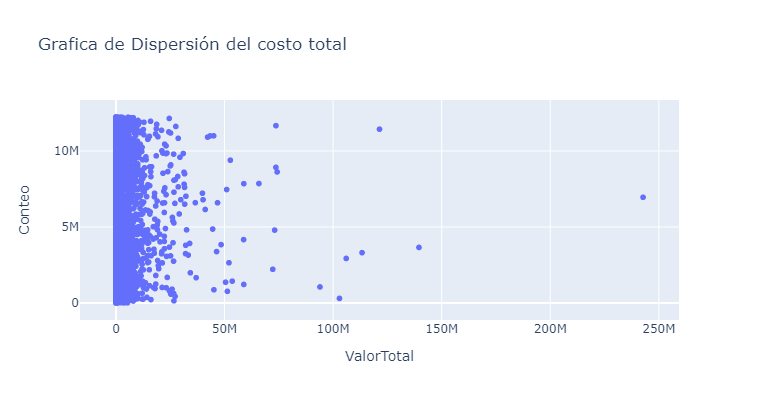

In [ ]:
fig=px.scatter(df_costo, x=df_costo.ValorTotal,labels={'index':'Conteo'},title='Grafica de Dispersión del costo total',width=600, height=400)
fig.show()

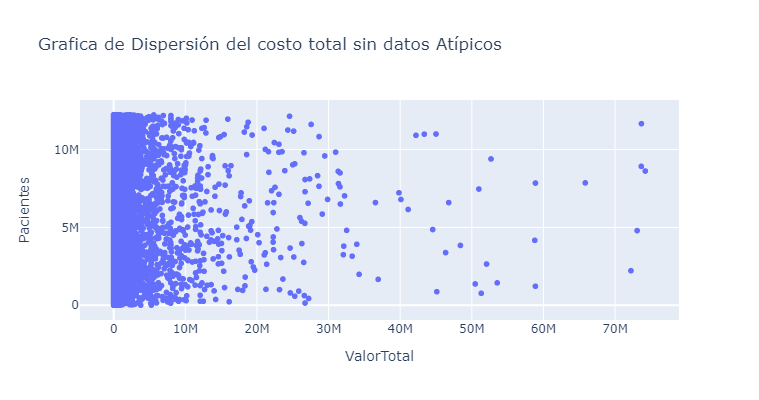

In [ ]:
# Se elinan los valores atípicos
df_costo = df_costo[df_costo["ValorTotal"]<90000000]

fig=px.scatter(df_costo, x=df_costo.ValorTotal,labels={'index':'Pacientes'},title='Grafica de Dispersión del costo total sin datos Atípicos',width=600, height=400)
fig.show()

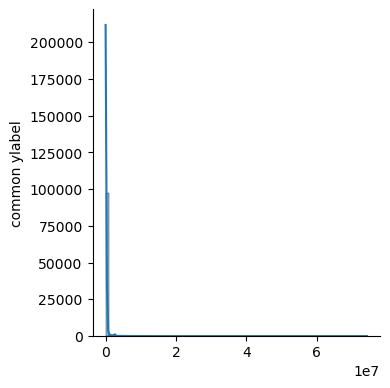

In [ ]:
plt = sns.displot(x = df_costo.ValorTotal , bins=82, kde=True,height=4);
plt.set(xlabel='', ylabel='common ylabel')

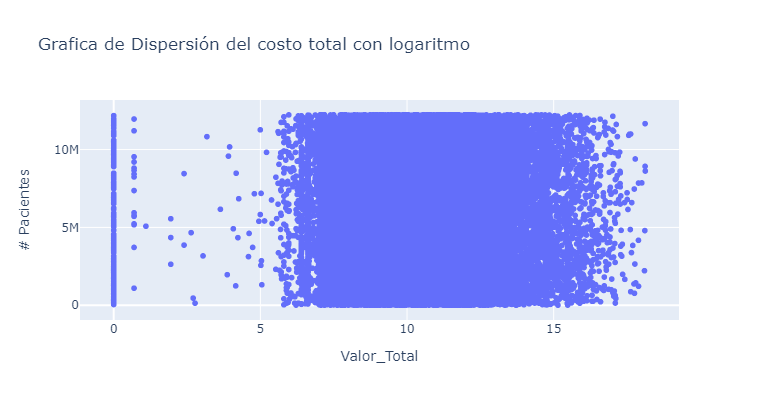

In [ ]:
fig=px.scatter(df_costo, x=np.log(df_costo.ValorTotal+1),labels={'index':'# Pacientes','x':'Valor_Total'},title='Grafica de Dispersión del costo total con logaritmo',width=600, height=400)
fig.show()


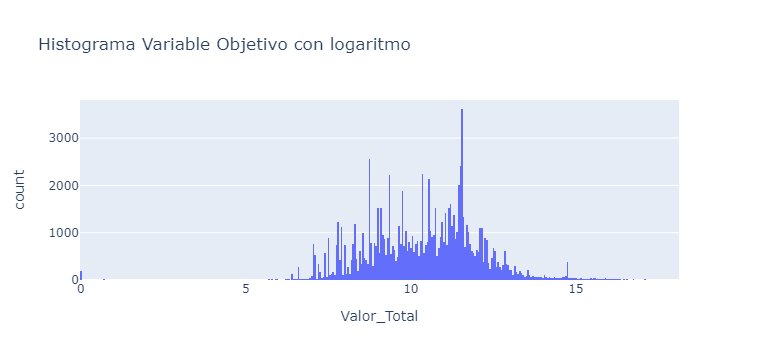

In [ ]:
fig=px.histogram(x=np.log(df_costo.ValorTotal+1),title='Histograma Variable Objetivo con logaritmo',labels={'  count ':'# Pacientes','x':'Valor_Total'})
fig.show()

#TRATAMIENTO DE LOS DATOS

In [ ]:
# Eliminacion de columnas
df_costo1 = df_costo.drop(['Fuente','Anio','MesFallecimiento','Segmentacion','NitIpsPrestador','RazonSocialIpsPrestador','ConteoUsuariosUnicos'], axis=1)
df_costo11=df_costo1 # Copia de dataset inicial

#df_aut1 = df_aut.drop(['Fuente','Anio','Mes','MesFallecimiento','Segmentacion','NitIpsPrestador','RazonSocialIpsPrestador','ConteoUsuariosUnicos'], axis=1)

In [ ]:
# Conversion de valores nulos en 0 de la columna AnioFallecimiento
df_costo1['AnioFallecimiento']=df_costo1['AnioFallecimiento'].fillna(0)


# Conversion de valores distintos a 0 en 1 
a = []
for i in df_costo1['AnioFallecimiento']:
  if i == 0:
    a.append(0)
  else:
    a.append(1)

df_costo1=df_costo1.assign(Fallecido=a) # crea columna con el resultado del for
df_costo1=df_costo1.drop(['AnioFallecimiento'], axis=1) #elimina columna AnioFallecimiento

In [ ]:
datos(df_costo1) # Revision del dataframe Tipo, categorias y nulos de las variables

,Nombre de columna,Tipo de dato,Cantidad valores únicos,Cantidad valores nulos
0,Mes,int64,12,0
1,TipoIdentificacion,object,5,0
2,NumeroIdentificacion,int64,86737,0
3,Sexo,object,2,0
4,ESTADIO,object,4,0
5,RESINCRONIZADOR,object,2,0
6,grEstandar,object,11,0
7,Patologia,object,16,0
8,RegionalIpsAfiliado,object,8,0
9,ZonalIpsAfiliado,object,33,0


#RECATEGORIZACIÓN DE VARIABLES

In [ ]:
a=[] # creacion de lista vacia
for i in df_costo11['Patologia']:
  if i in ('09. VIH','02. ENF. HUERFANAS O RARAS','06. ESCLEROSIS MULTIPLE','13. TRASPLANTES','01. HEMOFILIA','08. HEPATITIS C','10. FIBROSIS QUISTICA'):
    a.append('otros')   # Renombra 'otros' si no se encuentra dentro de las categorias seleccionadas
  elif i in ('04. DIALISIS','14. ENFERMEDAD RENAL CRONICA','15. PREDIALISIS'):
    a.append('ENFERMEDAD RENAL CRONICA')
  else:
    a.append(i)
           # Si se encuentra dentro de la categorias se deja igual

df_costo11=df_costo11.assign(Patologia=a)  # Reemplazo de la columnna con la lista creada

In [ ]:
df_costo11=df_costo11[df_costo11['RegionalIpsAfiliado']!='SIN REGIONAL']

In [ ]:
a=[] # creacion de lista vacia
for i in df_costo11['Nivel1']:
  if i not in ('HOSPITALARIO','AMBULATORIO', 'MEDICAMENTOS'): # Seleccion de las primeras categorias de la variable 
   a.append('otros')   # Renombra 'otros' si no se encuentra dentro de las categorias seleccionadas
  else:
   a.append(i)         # Si se encuentra dentro de la categorias se deja igual

df_costo11=df_costo11.assign(Nivel1=a)  # Reemplazo de la columnna con la lista creada

In [ ]:
a=[] # creacion de lista vacia
for i in df_costo11['Nivel2']:
  if i in ('TRASLADO ASISTENCIAL','TRASLADO NO ASISTENCIAL','ALOJAMIENTO Y MANUTENCION','NO APLICA','ADMINISTRATIVO','PRODUCTOS NATURALES','INSUMOS','COSMETICOS','ALIMENTOS','DISPOSITIVOS MEDICOS'):
    a.append('otros')   # Renombra 'otros' si no se encuentra dentro de las categorias seleccionadas
  elif i in ('MEDICAMENTOS','MEDICAMENTOS COMPRA DIRECTA','MEDICAMENTOS HEMOFILIA','CONSULTAS'):
    a.append('MEDICAMENTOS')
  elif i in ('INTERNACION MEDICA','INTERNACION QUIRURGICA','TRATAMIENTO QUIRURGICO ENFERMEDADES CONGENITAS'):
    a.append('INTERNACION')
  elif i in ('REEMPLAZOS ARTICULARES','REVISION DE REEMPLAZOS ARTICULARES'):
    a.append('REAMPLAZOS ARTICULARES')
  else:
    a.append(i)

df_costo11=df_costo11.assign(Nivel2=a)  # Reemplazo de la columnna con la lista creada

##Recategorizacion de las 5 primeras categorias deacuerdo a la cantidad de personas de las variables que tienen mas de 10 categorias, el restante se deja en la categoria 'otros'

In [ ]:

# ZonalIpsPrestador
a=[] # creacion de lista vacia
for i in df_costo11['ZonalIpsPrestador']:
  if i not in ('ZONAL BOGOTA', 'ZONAL ATLANTICO', 'ZONAL SANTANDER', 'ZONAL ANTIOQUIA', 'ZONAL VALLE DEL CAUCA', 'ZONAL CALDAS', 'ZONAL RISARALDA'): # Seleccion de las primeras categorias de la variable 
   a.append('otros')   # Renombra 'otros' si no se encuentra dentro de las categorias seleccionadas
  else:
   a.append(i)         # Si se encuentra dentro de la categorias se deja igual

df_costo11=df_costo11.assign(ZonalIpsPrestador=a)  # Reemplazo de la columnna con la lista creada

#ZonalIpsAfiliado

a=[] # creacion de lista vacia
for i in df_costo11['ZonalIpsAfiliado']:
  # Seleccion de las primeras categorias de la variable
  if i not in ('ZONAL BOGOTA', 'ZONAL ANTIOQUIA', 'ZONAL VALLE DEL CAUCA', 'ZONAL SANTANDER', 'ZONAL ATLANTICO', 'ZONAL CALDAS', 'ZONAL CUNDINAMARCA', 'ZONAL BOYACA', 'ZONAL RISARALDA', 'ZONAL TOLIMA', 'ZONAL NORTE DE SANTANDER', 'ZONAL BOLIVAR', 'ZONAL CAUCA', 'ZONAL CORDOBA', 'ZONAL QUINDIO' ):
   a.append('otros')  # Renombra 'otros' si no se encuentra dentro de las categorias seleccionadas
  else:
   a.append(i)        # Si se encuentra dentro de la categorias se deja igual

df_costo11=df_costo11.assign(ZonalIpsAfiliado=a)   # Reemplazo de la columnna con la lista creada

#Nivel3

a=[]  # creacion de lista vacia
for i in df_costo11['Nivel3']:
  # Seleccion de las primeras categorias de la variable
  if i not in ('MEDICAMENTO', 'PROCEDIMIENTOS DE DIAGNOSTICO', 'CONSULTA EXTERNA', 'MONITOREO Y CONTROL', 'ATENCION DOMICILIARIA', 'CONSULTA DE URGENCIAS', 'ABSORBENTES Y PAÑOS HUMEDOS', 'INTERNACION GENERAL'):
   a.append('otros')    # Renombra 'otros' si no se encuentra dentro de las categorias seleccionadas
  else:
   a.append(i)          # Si se encuentra dentro de la categorias se deja igual

df_costo11=df_costo11.assign(Nivel3=a)    # Reemplazo de la columnna con la lista creada

#Nivel4

a=[] # creacion de lista vacia
for i in df_costo11['Nivel4']:
  if i not in ('INMUNOLOGIA', 'ROSUVASTATINA', 'CARVEDILOL', 'AGUJAS JERINGAS', 'ESPECIALIDADES', 'TIRILLAS', 'LANCETAS', 'INSULINA GLARGINA', 'CONSULTA DE URGENCIAS', 'SUBESPECIALIDADES'):
   a.append('otros')    # Renombra 'otros' si no se encuentra dentro de las categorias seleccionadas
  else:
   a.append(i)          # Si se encuentra dentro de la categorias se deja igual

df_costo11=df_costo11.assign(Nivel4=a)   # Reemplazo de la columnna con la lista creada

#Nivel5
a=[] # creacion de lista vacia
for i in df_costo11['Nivel5']:
  # Renombra 'otros' si no se encuentra dentro de las categorias seleccionadas
  if i not in ('INMUNOLOGIA', 'ROSUVASTATINA', 'CARVEDILOL', 'AGUJAS JERINGAS', 'ESPECIALIDADES', 'TIRILLAS', 'LANCETAS', 'INSULINA GLARGINA', 'CONSULTA DE URGENCIAS', 'SUBESPECIALIDADES'):
   a.append('otros')    # Renombra 'otros' si no se encuentra dentro de las categorias seleccionadas
  else:
   a.append(i)          # Si se encuentra dentro de la categorias se deja igual

df_costo11=df_costo11.assign(Nivel5=a)   # Reemplazo de la columnna con la lista creada

Se borra la variable marca ya que no aporta al estudio de la base de datos

In [ ]:
#df_costo2 = df_costo11.drop(['MARCA'],axis=1) # Eliminacion de variable MARCA
df_costo2 = df_costo11.drop(['MARCA','RESINCRONIZADOR','ZonalIpsPrestador','ZonalIpsAfiliado','EstadoCovid','ValorTotaNOPOS','ValorTotaPOS'],axis=1) 
df_costo2=df_costo2.drop(['TipoIdentificacion', 'NumeroIdentificacion','Mes','AnioFallecimiento'], axis=1)
datos(df_costo2)
#df_costo1.columns

,Nombre de columna,Tipo de dato,Cantidad valores únicos,Cantidad valores nulos
0,Sexo,object,2,0
1,ESTADIO,object,4,0
2,grEstandar,object,11,0
3,Patologia,object,8,0
4,RegionalIpsAfiliado,object,8,0
5,RegionalIpsPrestador,object,8,0
6,Nivel1,object,4,0
7,Nivel2,object,16,0
8,Nivel3,object,7,0
9,Nivel4,object,10,0


# MODELOS

In [ ]:
df_costo2["ConteoEvento"]=df_costo2["ConteoEvento"].replace(0,1) #Crea una nueva variable llamada Conteo Evento
df_costo2['Costo_Unitario'] = df_costo2["ValorTotal"] / df_costo2["ConteoEvento"] #Agrega una nueva variable llamada costo unitario

In [ ]:
#Modelo #1 - Regresión líneal con variable objetivo costo total original
Y=df_costo2["ValorTotal"]  # VARIABLE OBJETIVO COSTO TOTAL
  #Logaritmo variable objetivo
X=df_costo2.drop(["ValorTotal","Costo_Unitario"], axis=1)
X=pd.get_dummies(X, drop_first=True)
#Creo un ACP con la base CUANT

X

,ConteoEvento,Sexo_M,ESTADIO_B,ESTADIO_C,ESTADIO_D,grEstandar_03. 5 A 14 AÑOS,grEstandar_04. 15 A 18 AÑOS,grEstandar_05. 19 A 44 AÑOS,grEstandar_06. 45 A 49 AÑOS,grEstandar_07. 50 A 54 AÑOS,...,Nivel4_otros,Nivel5_CARVEDILOL,Nivel5_CONSULTA DE URGENCIAS,Nivel5_ESPECIALIDADES,Nivel5_INSULINA GLARGINA,Nivel5_LANCETAS,Nivel5_ROSUVASTATINA,Nivel5_SUBESPECIALIDADES,Nivel5_TIRILLAS,Nivel5_otros
1096368,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
6068406,1,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,1
726842,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
11127650,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
11925632,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7411320,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
11423563,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
4343560,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
7423495,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1


In [ ]:
X1=X.head(0)
X1.to_excel('C:/Users/usuario/OneDrive/Documents/Datos/X.xlsx')

In [ ]:
## Estandarizar 
escala=StandardScaler(with_mean=True, with_std=True)
escala.fit(X)
datosestan=escala.transform(X)
## Realizo el ACP
pca=PCA(0.9)
pca.fit(datosestan)  ## Ajusto el PCA (valores, vectpores, varianza)
nuevosACP=pca.transform(datosestan)
print(pca.explained_variance_ratio_)  ##
X=nuevosACP
X_train, X_test, Y_train, Y_test= train_test_split(X, Y, train_size=0.8, random_state=20)
Y_train = Y_train + 1
Y_test = Y_test + 1
#Prueba Regresion Lineal con variable objetivo costo total
RegresionLineal=linear_model.LinearRegression().fit(X_train, Y_train)
# print("Intercepto", RegresionLineal.intercept_)
# print("betas", pd.DataFrame(RegresionLineal.coef_, index=X_train.columns))
Y_pred_train=RegresionLineal.predict(X_train) ### Pronostico
Y_pred_test=RegresionLineal.predict(X_test)

print("********* REGRESIÓN LINEAL ************")
print("Error Porcentual Absoluto Medio entrenamiento",mean_absolute_percentage_error(Y_train, Y_pred_train)) ### Los datos de entrenamiento
print("Error Porcentual Absoluto Medio prueba",mean_absolute_percentage_error(Y_test, Y_pred_test)) ### Los datos de prueba
print("El R2 de entrenamiento es ",100*np.round(r2_score(Y_train, Y_pred_train),4), "%")
print("El R2 de prueba es ",100*np.round(r2_score(Y_test, Y_pred_test),4), "%")

[0.06401505 0.04949681 0.04775685 0.0387184  0.02918743 0.0283725
 0.02717788 0.0269176  0.02608209 0.02570007 0.02204636 0.02165592
 0.02019842 0.01940882 0.01926198 0.01881251 0.01831069 0.01806961
 0.01690599 0.01572906 0.01540316 0.01517112 0.01490486 0.01442251
 0.01436431 0.01406536 0.01378817 0.0135459  0.01344116 0.01319732
 0.01317122 0.0130164  0.01298477 0.01290267 0.01287416 0.01282827
 0.01280772 0.0127946  0.01278236 0.01275641 0.01269225 0.0126569
 0.01244482 0.01207221 0.01194058 0.01182903 0.01145737]
********* REGRESIÓN LINEAL ************
Error Porcentual Absoluto Medio entrenamiento 705.4047245533067
Error Porcentual Absoluto Medio prueba 642.2268020423412
El R2 de entrenamiento es  20.54 %
El R2 de prueba es  21.92 %


In [ ]:
resid = pd.DataFrame({"test":Y_test, "predict":Y_pred_test, "diff":np.abs(Y_test-Y_pred_test)})
resid.sort_values("predict", ascending=False)

,test,predict,diff
6151226,41109320.0,2.273718e+07,1.837214e+07
9992125,1176862.0,2.263190e+07,2.145504e+07
2564561,7391441.0,2.245486e+07,1.506342e+07
2541298,12022707.0,1.538294e+07,3.360236e+06
11787802,1711834.0,1.525938e+07,1.354755e+07
...,...,...,...
8137697,152939.0,-6.039618e+05,7.569008e+05
1487569,407001.0,-6.755414e+05,1.082542e+06
5991090,244401.0,-6.828283e+05,9.272293e+05
7300364,265321.0,-7.035298e+05,9.688508e+05


In [ ]:
#Modelo #2 - Regresión líneal con variable objetivo tranformada con logaritmo
Y=df_costo2["ValorTotal"]  # VARIABLE OBJETIVO 
Y=np.log(Y+1)
  #Logaritmo variable objetivo
X=df_costo2.drop(["ValorTotal","Costo_Unitario"], axis=1)
X=pd.get_dummies(X, drop_first=True)
#Creo un ACP con la base CUANTI
## Estandarizar 
escala=StandardScaler(with_mean=True, with_std=True)
escala.fit(X)
datosestan=escala.transform(X)
## Realizo el ACP
pca=PCA(0.9)
pca.fit(datosestan)  ## Ajusto el PCA (valores, vectpores, varianza)
nuevosACP=pca.transform(datosestan)
print(pca.explained_variance_ratio_)  ##
X=nuevosACP
X_train, X_test, Y_train, Y_test= train_test_split(X, Y, train_size=0.8, random_state=20)
Y_train = Y_train + 1
Y_test = Y_test + 1

#Prueba Regresion Lineal 2 millones de datos con PCA
RegresionLineal=linear_model.LinearRegression().fit(X_train, Y_train)
Y_pred_train=RegresionLineal.predict(X_train) ### Pronostico
Y_pred_test=RegresionLineal.predict(X_test)
#Y_pred_train=np.exp(RegresionLineal.predict(X_train))-1 ### Pronostico
#Y_pred_test=np.exp(RegresionLineal.predict(X_test))-1

print("********* REGRESIÓN LINEAL ************")
print("Error Porcentual Absoluto Medio entrenamiento",mean_absolute_percentage_error(Y_train, Y_pred_train)) ### Los datos de entrenamiento
print("Error Porcentual Absoluto Medio prueba",mean_absolute_percentage_error(Y_test, Y_pred_test)) ### Los datos de prueba
print("El R2 de entrenamiento es ",100*np.round(r2_score(Y_train, Y_pred_train),4), "%")
print("El R2 de prueba es ",100*np.round(r2_score(Y_test, Y_pred_test),4), "%")

[0.06401505 0.04949681 0.04775685 0.0387184  0.02918743 0.0283725
 0.02717788 0.0269176  0.02608209 0.02570007 0.02204636 0.02165592
 0.02019842 0.01940882 0.01926198 0.01881251 0.01831069 0.01806961
 0.01690599 0.01572906 0.01540316 0.01517112 0.01490486 0.01442251
 0.01436431 0.01406536 0.01378817 0.0135459  0.01344116 0.01319732
 0.01317122 0.0130164  0.01298477 0.01290267 0.01287416 0.01282827
 0.01280772 0.0127946  0.01278236 0.01275641 0.01269225 0.0126569
 0.01244482 0.01207221 0.01194058 0.01182903 0.01145737]
********* REGRESIÓN LINEAL ************
Error Porcentual Absoluto Medio entrenamiento 0.12015329677556859
Error Porcentual Absoluto Medio prueba 0.12160333885017426
El R2 de entrenamiento es  30.709999999999997 %
El R2 de prueba es  30.490000000000002 %


In [ ]:
Y

1096368     10.229296
6068406     11.992019
726842      11.549363
11127650     8.014666
11925632    11.023258
              ...    
7411320      8.981053
11423563     9.387733
4343560     11.549363
7423495     11.257582
8818087      9.784760
Name: ValorTotal, Length: 99993, dtype: float64

In [ ]:
print("********* MODELO RANDOM FOREST INICIAL CON VARIABLE COSTO TOTAL Y VALORES FRECUENTES ************")
# Y=df_costo2["ValorTotal"]  # VARIABLE OBJETIVO
# X_train, X_test, Y_train, Y_test= train_test_split(X, Y, train_size=0.8, random_state=20)
RFR=RandomForestRegressor(n_estimators=100,min_weight_fraction_leaf=0.05)  ## Para evitar sobreajuste
RFR.fit(X_train, Y_train)
pred_train=RFR.predict(X_train)
print("El R2 de entrenamiento es ",100*np.round(r2_score(Y_train, pred_train),4), "%")
print("Error Porcentual Absoluto Medio entrenamiento",mean_absolute_percentage_error(Y_train, Y_pred_train)) ### Los datos de entrenamiento
pred_test=RFR.predict(X_test)
print("El R2 de prueba es ",100*np.round(r2_score(Y_test, pred_test),4), "%")
print("Error Porcentual Absoluto Medio prueba",mean_absolute_percentage_error(Y_test, Y_pred_test)) ### Los datos de prueba

********* RANDOM FOREST INICIAL CON VARIABLE COSTO TOTAL ************
El R2 de entrenamiento es  24.21 %
Error Porcentual Absoluto Medio entrenamiento 0.11979783373959235
El R2 de prueba es  23.96 %
Error Porcentual Absoluto Medio prueba 0.12285477021986678


In [ ]:
print("********* RANDOM FOREST POSTERIOR AL OOB CON VARIABLE ************")
RFR=RandomForestRegressor(n_estimators=96, max_depth=15, max_features=12, max_samples=79994) #
RFR.fit(X_train, Y_train)
pred_train=RFR.predict(X_train)
print("El R2 de entrenamiento es ",100*np.round(r2_score(Y_train, pred_train),4), "%")
print("Error Porcentual Absoluto Medio entrenamiento",mean_absolute_percentage_error(Y_train, Y_pred_train)) ### Los datos de entrenamiento
pred_test=RFR.predict(X_test)
print("El R2 de prueba es ",100*np.round(r2_score(Y_test, pred_test),4), "%")
print("Error Porcentual Absoluto Medio prueba",mean_absolute_percentage_error(Y_test, Y_pred_test)) ### Los datos de prueba

********* RANDOM FOREST POSTERIOR AL OOB CON VARIABLE COSTO TOTAL************
El R2 de entrenamiento es  43.769999999999996 %
Error Porcentual Absoluto Medio entrenamiento 0.12015329677556859
El R2 de prueba es  37.169999999999995 %
Error Porcentual Absoluto Medio prueba 0.12160333885017426


In [ ]:
print("*********REGRESIÓN DE VECTORES DE SOPORTE CON VARIABLE COSTO TOTAL************")

svm=SVR(C=1, kernel="rbf")  ### SVR con kernel gaussiano y parametro de penalizacion 1
svm.fit(X_train, Y_train)   ## Entreneme ese modelo
print("Datos en el entrenamiento=", X_train.shape[0])
print("Vectores soporte=",svm.support_vectors_.shape[0])
y_pred_train=svm.predict(X_train)
y_pred_test=svm.predict(X_test)
print("El R2 de entrenamiento es ",100*np.round(r2_score(Y_train, y_pred_train),4), "%")
print("Error Porcentual Absoluto Medio entrenamiento",mean_absolute_percentage_error(Y_train, y_pred_train)) ### Los datos de entrenamiento
print("El R2 de prueba es ",100*np.round(r2_score(Y_test, y_pred_test),4), "%")
print("Error Porcentual Absoluto Medio prueba",mean_absolute_percentage_error(Y_test, y_pred_test)) ### Los datos de prueba

*********REGRESIÓN DE VECTORES DE SOPORTE CON VARIABLE COSTO TOTAL************
Datos en el entrenamiento= 79994
Vectores soporte= 71182
El R2 de entrenamiento es  34.699999999999996 %
Error Porcentual Absoluto Medio entrenamiento 0.11242696923299454
El R2 de prueba es  32.59 %
Error Porcentual Absoluto Medio prueba 0.11765910736895967


In [ ]:
print("*********REGRESIÓN DE VECTORES DE SOPORTE CON VALIDACIÓN CRUZADA************")

svm=SVR(C=0.1,kernel="poly")  ### SVR con kernel gaussiano y parametro de penalizacion 1
svm.fit(X_train, Y_train)   ## Entreneme ese modelo
print("Datos en el entrenamiento=", X_train.shape[0])
print("Vectores soporte=",svm.support_vectors_.shape[0])
y_pred_train=svm.predict(X_train)
y_pred_test=svm.predict(X_test)
print("El R2 de entrenamiento es ",100*np.round(r2_score(Y_train, y_pred_train),4), "%")
print("Error Porcentual Absoluto Medio entrenamiento",mean_absolute_percentage_error(np.log(Y_train) -1, np.log(y_pred_train))-1) ### Los datos de entrenamiento
print("El R2 de prueba es ",100*np.round(r2_score(Y_test, y_pred_test),4), "%")
print("Error Porcentual Absoluto Medio prueba",mean_absolute_percentage_error(Y_test, y_pred_test)) ### Los datos de prueba

*********REGRESIÓN DE VECTORES DE SOPORTE CON VARIABLE COSTO TOTAL************


*OOB PARA RANDOM FOREST*

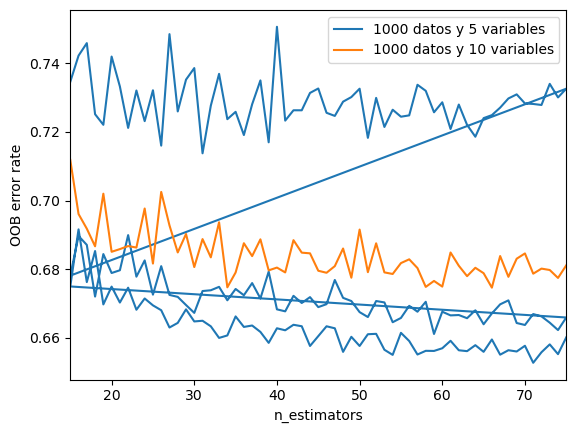

In [ ]:
from collections import OrderedDict
#RANDOM_STATE=20
ensemble_RF= [
    ("1000 datos y 5 variables",
        RandomForestRegressor(max_depth=5,max_samples=1000, oob_score = True, max_features=5)),
    ("1000 datos y 5  variables",
        RandomForestRegressor(max_depth=8,max_samples=1000, oob_score = True, max_features=5)),
    ("1000 datos y 5 variables",
        RandomForestRegressor(max_depth=10, max_samples=1000, oob_score = True, max_features=5)),
    ("1000 datos y 5 variables",
        RandomForestRegressor(max_depth=15, max_samples=1000, oob_score = True, max_features=5))
]

# Map a classifier name to a list of (<n_estimators>, <error rate>) pairs.
error_rate = OrderedDict((label, []) for label, _ in ensemble_RF)

# Range of `n_estimators` values to explore.
min_estimators = 15
max_estimators = 75

for label, clf in ensemble_RF:
    for i in range(min_estimators, max_estimators + 1):
        clf.set_params(n_estimators=i)
        clf.fit(X_train, Y_train)

        # Record the OOB error for each `n_estimators=i` setting.
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))

# Generate the "OOB error rate" vs. "n_estimators" plot.
for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    plt.plot(xs, ys, label=label)

plt.xlim(min_estimators, max_estimators)
plt.xlabel("n_estimators")
plt.ylabel("OOB error rate")
plt.legend(loc="upper right")
plt.show()

**Validación Cruzada Soporte Regresión vectorial**

In [ ]:
#VALIDACIÓN CRUZADA PARA MODELOS DE SVR
X_train, X_test, y_train, y_test=train_test_split(X, Y, test_size=0.2) #Entrenamiento prueba
svm=SVR(C=1, kernel="rbf")  ### SVR con kernel gaussiano y parametro de penalizacion 1
svm.fit(X_train, y_train)   ## Entreneme ese modelo
print("Datos en el entrenamiento=", X_train.shape[0])
print("Vectores soporte=",svm.support_vectors_.shape[0])


In [ ]:
y_pred_train=svm.predict(X_train)
y_pred_test=svm.predict(X_test)

In [ ]:
print("El R2 de entrenamiento es ",100*np.round(r2_score(y_train, y_pred_train),4), "%")
print("El R2 de prueba es ",100*np.round(r2_score(y_test, y_pred_test),4), "%")

El R2 de entrenamiento es  33.95 %
El R2 de prueba es  33.71 %


In [ ]:
params_grid = [{'kernel': ['poly'],'degree': [2] ,'C': [0.1,0.01, 1,10, 100]}]
#   {'kernel': ['sigmoid'],'C': [0.01, 0.1, 1, 10, 100]}
#    {'kernel': ['rbf'],'C': [0.01, 0.1, 1, 10, 100]}
#               {'kernel': ['poly'],'degree': [2,3,4,5] ,'C': [0.01, 1, 100]}

In [ ]:
#Validación Cruzada
svm_model = GridSearchCV(SVR(), params_grid, cv=5, scoring="r2")

Prueba con el nucleo gaussiano

In [ ]:
svm_model.fit(X_train, y_train)
# View the accuracy score
print('Mejor metrica del conjunto:', svm_model.best_score_,"\n") 
# View the best parameters for the model found using grid search
print('Mejor C:',svm_model.best_estimator_.C,"\n") 
print('Mejor Kernel:',svm_model.best_estimator_.kernel,"\n")
print('Grado:', svm_model.best_estimator_.degree)

Mejor metrica del conjunto: 0.3114683594022202 

Mejor C: 1 

Mejor Kernel: rbf 

Grado: 3


Prueba con el nucleo sigmoide

In [ ]:
svm_model.fit(X_train, y_train)
# View the accuracy score
print('Mejor metrica del conjunto:', svm_model.best_score_,"\n") 
# View the best parameters for the model found using grid search
print('Mejor C:',svm_model.best_estimator_.C,"\n") 
print('Mejor Kernel:',svm_model.best_estimator_.kernel,"\n")
print('Grado:', svm_model.best_estimator_.degree)

Mejor metrica del conjunto: 0.031058064133740237 

Mejor C: 0.01 

Mejor Kernel: sigmoid 

Grado: 3


Prueba con el nucleo polinomico

In [ ]:
svm_model.fit(X_train, y_train)
# View the accuracy score
print('Mejor metrica del conjunto:', svm_model.best_score_,"\n") 
# View the best parameters for the model found using grid search
print('Mejor C:',svm_model.best_estimator_.C,"\n") 
print('Mejor Kernel:',svm_model.best_estimator_.kernel,"\n")
print('Grado:', svm_model.best_estimator_.degree)

Mejor metrica del conjunto: 0.35406208627365016 

Mejor C: 0.1 

Mejor Kernel: poly 

Grado: 2


#EXPORTAR MOLELO ELEGIDO

In [ ]:
filename, 'wb'))

In [ ]:
#Exportar el ACP
filename = 'C:/Users/usuario/OneDrive/Documents/Datos/ACP.sav'
pickle.dump(pca, open(filename, 'wb'))